# HH fitting Kv2.1 recordings

In [1]:
%load_ext autoreload
%autoreload 1

%aimport analysis_helpers
%aimport Kv21

import matplotlib.pyplot as plt
import numpy as np
import scipy.optimize
import stfio
import analysis_helpers as ah
import copy
import time
import multiprocessing as mp

/usr/lib64/python2.7/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: The mpl_toolkits.axes_grid module was deprecated in version 2.1. Use mpl_toolkits.axes_grid1 and mpl_toolkits.axisartist provies the same functionality instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


In [2]:
ana = [
    Kv21.Analysis('/home/kernfel/Documents/Data/Oocytes/2017_12_06_%04d.atf', (0,1,None), (2,3), factor = 2),
    Kv21.Analysis('/home/kernfel/Documents/Data/Oocytes/2017_12_06_%04d.atf', (4,5,None), (6,7), factor = 2),
    Kv21.Analysis('/home/kernfel/Documents/Data/Oocytes/2017_12_06_%04d.atf', (9,10,None), (11,12), factor = 2),
    Kv21.Analysis('/home/kernfel/Documents/Data/Oocytes/2017_12_06_%04d.atf', (13,14,None), (15,16), factor = 2),
    Kv21.Analysis('/home/kernfel/Documents/Data/Oocytes/2017_12_06_%04d.atf', (17,18,None), (19,20), factor = 2, out_factor = 5),
    Kv21.Analysis('/home/kernfel/Documents/Data/Oocytes/2017_12_06_%04d.atf', (21,22,None), (23,24)),
    Kv21.Analysis('/home/kernfel/Documents/Data/Oocytes/2017_12_06_%04d.atf', (25,26,None), (27,28)),
    
    Kv21.Analysis('/home/kernfel/Documents/Data/Oocytes/2018_05_03_%04d.atf', (0,4,5,6), ()),
    Kv21.Analysis('/home/kernfel/Documents/Data/Oocytes/2018_05_03_%04d.atf', (7,8,9,10), ()),
    Kv21.Analysis('/home/kernfel/Documents/Data/Oocytes/2018_05_03_%04d.atf', (15,16,17,18), ()),
    Kv21.Analysis('/home/kernfel/Documents/Data/Oocytes/2018_05_03_%04d.atf', (19,20,21,22), ()),
    Kv21.Analysis('/home/kernfel/Documents/Data/Oocytes/2018_05_03_%04d.atf', (23,24,25,26), ()),
    Kv21.Analysis('/home/kernfel/Documents/Data/Oocytes/2018_05_03_%04d.atf', (67,68,69,70), ()),
    Kv21.Analysis('/home/kernfel/Documents/Data/Oocytes/2018_05_03_%04d.atf', (71,72,73,74), ()),
    Kv21.Analysis('/home/kernfel/Documents/Data/Oocytes/2018_05_03_%04d.atf', (75,76,77,78), ()),
    
    Kv21.Analysis('/home/kernfel/Documents/Data/Round3/2019_02_01/2019_02_01_%04d.atf', (72,73,74), (75,76,77,78)),
    Kv21.Analysis('/home/kernfel/Documents/Data/Round3/2019_02_08/2019_02_08_%04d.atf', (0,1,2), (3,4,5,6,7,8)),
    Kv21.Analysis('/home/kernfel/Documents/Data/Round3/2019_02_08/2019_02_08_%04d.atf', (9,10,11), (12,13,14,15,16,17)),
    Kv21.Analysis('/home/kernfel/Documents/Data/Round3/2019_02_08/2019_02_08_%04d.atf', (18,19,20), (21,22,23,24,25)),
    Kv21.Analysis('/home/kernfel/Documents/Data/Round3/2019_02_08/2019_02_08_%04d.atf', (26,27,28), (29,30,31,32,33,34)),
    Kv21.Analysis('/home/kernfel/Documents/Data/Round3/2019_02_08/2019_02_08_%04d.atf', (35,36,37), (38,39,40,41,42,43)),
    Kv21.Analysis('/home/kernfel/Documents/Data/Round3/2019_02_08/2019_02_08_%04d.atf', (44,45,46), (47,48,49,50,51,52)),
    Kv21.Analysis('/home/kernfel/Documents/Data/Round3/2019_02_15/2019_02_15_%04d.atf', (21,22,23), (24,25,26,27,28,29)),
    Kv21.Analysis('/home/kernfel/Documents/Data/Round3/2019_02_15/2019_02_15_%04d.atf', (32,33,34), (35,36,37,38,39,40)),
    Kv21.Analysis('/home/kernfel/Documents/Data/Round3/2019_02_15/2019_02_15_%04d.atf', (41,42,43), (44,45,46,47,48,49)),
    Kv21.Analysis('/home/kernfel/Documents/Data/Round3/2019_02_15/2019_02_15_%04d.atf', (50,51,52), (53,54,55,56,57,58)),
    Kv21.Analysis('/home/kernfel/Documents/Data/Round3/2019_02_15/2019_02_15_%04d.atf', (65,66,67), (68,69,70,71,72,73)),
]

In [71]:
crop = [0] * len(ana)
crop[4] = 1
crop[8] = 2
crop[20] = 1

In [3]:
for a in ana:
    print a.paramsfile
    a.fit()

/home/kernfel/Documents/Data/Oocytes/2017_12_06_0002.params


analysis_helpers.py:124: RuntimeWarning: overflow encountered in exp
  return p[0]*np.exp(-t/p[1]) + p[2]*np.exp(-t/p[3])
analysis_helpers.py:124: RuntimeWarning: overflow encountered in multiply
  return p[0]*np.exp(-t/p[1]) + p[2]*np.exp(-t/p[3])


/home/kernfel/Documents/Data/Oocytes/2017_12_06_0006.params
Trace 8 truncated fast tau 14.032157501247685
Trace 9 truncated fast tau 2.0715531038917696
/home/kernfel/Documents/Data/Oocytes/2017_12_06_0011.params
Trace 10 truncated fast tau 25.800832457655154
/home/kernfel/Documents/Data/Oocytes/2017_12_06_0015.params
Trace 9 truncated fast tau 2.8663573878236654
Trace 10 truncated fast tau 2.8663573878236654
/home/kernfel/Documents/Data/Oocytes/2017_12_06_0019.params
/home/kernfel/Documents/Data/Oocytes/2017_12_06_0023.params
/home/kernfel/Documents/Data/Oocytes/2017_12_06_0027.params
Trace 10 truncated fast tau 2.3248975646558527
Trace 11 truncated fast tau 2.3248975646558527
/home/kernfel/Documents/Data/Oocytes/2018_05_03_0006.params
/home/kernfel/Documents/Data/Oocytes/2018_05_03_0010.params
/home/kernfel/Documents/Data/Oocytes/2018_05_03_0018.params
Trace 8 truncated fast tau 14.148821056445398
Trace 9 truncated fast tau 14.148821056445398
Trace 10 truncated fast tau 14.14882105644

In [4]:
for a in ana:
    print '%s:\n%s\n' % (a.paramsfile, a.params_str())

/home/kernfel/Documents/Data/Oocytes/2017_12_06_0002.params:
gl:	4.905436 μS
El:	-2.645728 mV
gK:	116.554300 μS
EK:	-64.654539 mV
C:	215.597691 nF


/home/kernfel/Documents/Data/Oocytes/2017_12_06_0006.params:
gl:	7.313740 μS
El:	-4.408434 mV
gK:	31.431750 μS
EK:	-75.477615 mV
C:	168.940206 nF


/home/kernfel/Documents/Data/Oocytes/2017_12_06_0011.params:
gl:	4.714108 μS
El:	-7.086328 mV
gK:	18.670516 μS
EK:	-68.354803 mV
C:	214.074582 nF


/home/kernfel/Documents/Data/Oocytes/2017_12_06_0015.params:
gl:	7.243188 μS
El:	-8.768989 mV
gK:	59.209622 μS
EK:	-72.357433 mV
C:	170.574145 nF


/home/kernfel/Documents/Data/Oocytes/2017_12_06_0019.params:
gl:	2.002093 μS
El:	-8.261072 mV
gK:	154.714406 μS
EK:	-84.979890 mV
C:	217.697700 nF


/home/kernfel/Documents/Data/Oocytes/2017_12_06_0023.params:
gl:	1.057754 μS
El:	-12.952393 mV
gK:	40.726442 μS
EK:	-71.797504 mV
C:	181.154397 nF


/home/kernfel/Documents/Data/Oocytes/2017_12_06_0027.params:
gl:	21.334439 μS
El:	-7.633601 mV
gK:	116.258050

## HH fit with defined kinetics

In [5]:
def get_limits(a):
    tmax = 20000
    tblank = Kv21.rec_limits[0] - Kv21.rec_step_t0
    t2max = 10000
    t2blank = a.rec2.tail_cut - Kv21.rec2_limits[0]
    return tmax, tblank, t2max, t2blank

In [61]:
def get_targets(a, croptop = 0):
    '''prepare target traces, subtracting leak current with per-trace conductance'''
    tmax, tblank, t2max, t2blank = get_limits(a)
    end = len(a.rec.current) - croptop
    
    gleak = ah.get_gleak(a.rec, a.params['E_leak'], (0, Kv21.rec_step_t0))
    Irec_target = np.array([
                            I[Kv21.rec_limits[0] : Kv21.rec_limits[0] + tmax]
       - a.params['I_leak'](V[Kv21.rec_limits[0] : Kv21.rec_limits[0] + tmax], g)
                            for I, V, g in zip(a.rec.current[:end], a.rec.voltage[:end], gleak[:end])])
    
    gleak2 = ah.get_gleak(a.rec2, a.params['E_leak'], (0, Kv21.rec2_prepulse))
    Irec2_target = np.array([
                             I[a.rec2.tail_cut : a.rec2.tail_cut + t2max]
        - a.params['I_leak'](V[a.rec2.tail_cut : a.rec2.tail_cut + t2max], g)
                             for I, V, g in zip(a.rec2.current, a.rec2.voltage, gleak2)])
    
    return Irec_target, Irec2_target

In [62]:
def get_hold_voltages(a, croptop = 0):
    end = len(a.rec.current) - croptop
    Vhold = np.array([np.median(voltage[:Kv21.rec_step_t0]) for voltage in a.rec.voltage[:end]])
    Vhold2 = np.array([np.median(voltage[:Kv21.rec2_prepulse]) for voltage in a.rec2.voltage])
    return Vhold, Vhold2

In [63]:
def get_states(a, hold_voltages, pkinetic, croptop = 0):
    '''Return modelled states across the selected time periods'''
    tmax, tblank, t2max, t2blank = get_limits(a)
    end = len(a.rec.current) - croptop
    
    # Find hold states
    rec_hold_state = zip(*Kv21.state_at(10000, hold_voltages[0], (.5,.5,.5,.5), pkinetic))
    rec2_hold_state = zip(*Kv21.state_at(10000, hold_voltages[1], (.5,.5,.5,.5), pkinetic))
    
    # Populate the HH states over the fitting period
    rec_states = np.zeros((len(a.rec.voltage[:end]), tmax, 3))
    for i, voltage, state in zip(range(len(a.rec.voltage[:end])), a.rec.voltage[:end], rec_hold_state):
        for t in range(tblank):
            V = voltage[Kv21.rec_step_t0 + t]
            state = Kv21.state_at(Kv21.tres, V, state, pkinetic)

        for t in range(tmax):
            V = voltage[Kv21.rec_limits[0] + t]
            state = Kv21.state_at(Kv21.tres, V, state, pkinetic)
            rec_states[i][t] = state
    
    rec2_states = np.zeros((len(a.rec2.voltage), t2max, 3))
    for i, voltage, state in zip(range(len(a.rec2.voltage)), a.rec2.voltage, rec2_hold_state):
        for t in range(Kv21.rec2_prepulse, Kv21.rec2_limits[0]):
            state = Kv21.state_at(Kv21.tres, voltage[t], state, pkinetic)

        for t in range(t2blank):
            V = voltage[Kv21.rec2_limits[0] + t]
            state = Kv21.state_at(Kv21.tres, V, state, pkinetic)

        for t in range(t2max):
            V = voltage[a.rec2.tail_cut + t]
            state = Kv21.state_at(Kv21.tres, V, state, pkinetic)
            rec2_states[i][t] = state
    
    return rec_states, rec2_states

In [67]:
def get_currents(a, states, pfixed, croptop = 0):
    '''Return modelled currents based on states and g/E values'''
    tmax, tblank, t2max, t2blank = get_limits(a)
    end = len(a.rec.current) - croptop
    
    # Apply conductance to the states to compute the current
    Irec = np.reshape([(voltage[Kv21.rec_limits[0] + t] - pfixed[0])
                       * (pfixed[1] * state[0]**4 * state[1] + pfixed[2] * state[2]**4)

                      for voltage, strace in zip(a.rec.voltage[:end], states[0])
                      for t, state in enumerate(strace)],
                     (len(a.rec.voltage[:end]), tmax))

    Irec2 = np.reshape([(voltage[a.rec2.tail_cut + t] - pfixed[0])
                        * (pfixed[1] * state[0]**4 * state[1] + pfixed[2] * state[2]**4)

                       for voltage, strace in zip(a.rec2.voltage, states[1])
                       for t, state in enumerate(strace)],
                      (len(a.rec2.voltage), t2max))
    
    return Irec, Irec2

Text(0.5,0.98,'Unfitted initial values')

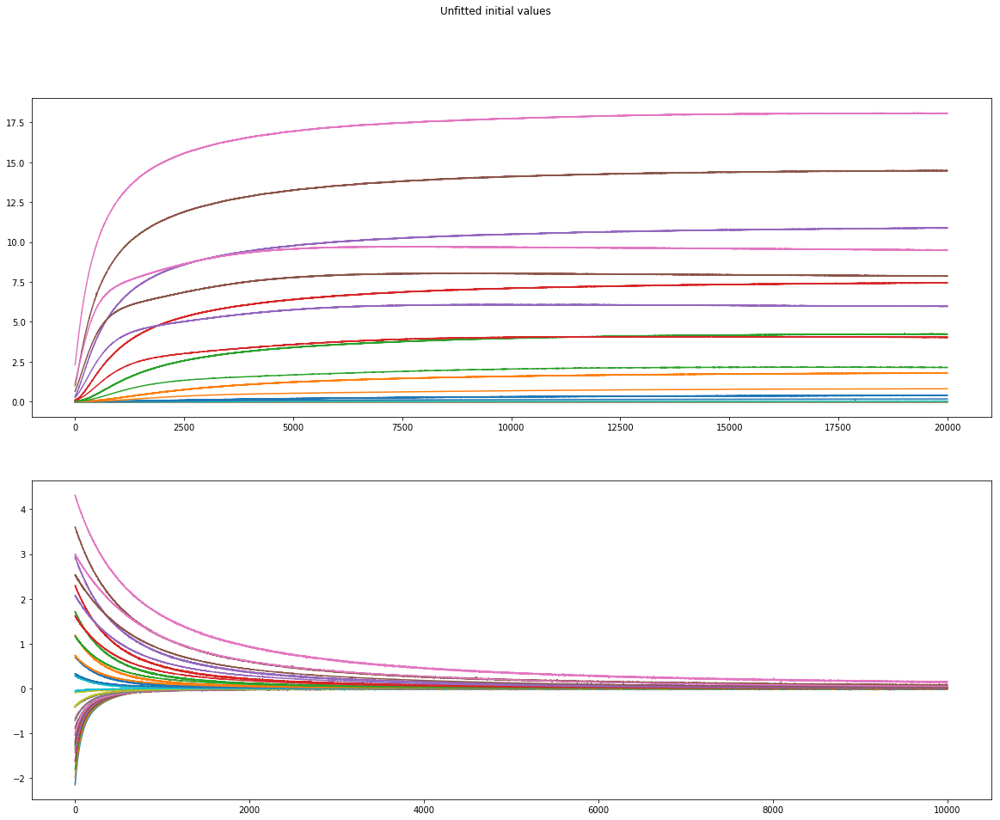

In [69]:
# Sanity check
states = get_states(ana[8], get_hold_voltages(ana[8]), Kv21.p_kinetic, croptop=2)
I1, I2 = get_currents(ana[8], states, (-74., 0.08, 0.03), croptop=2)
I1_target, I2_target = get_targets(ana[8], croptop=2)

plt.figure(figsize=(20,15))
plt.subplot(2,1,1)
for I in I1_target:
    plt.plot(I)
plt.gca().set_prop_cycle(None)
for I in I1:
    plt.plot(I)

plt.subplot(2,1,2)
for I in I2_target:
    plt.plot(I)
plt.gca().set_prop_cycle(None)
for I in I2:
    plt.plot(I)
    
plt.suptitle("Unfitted initial values")

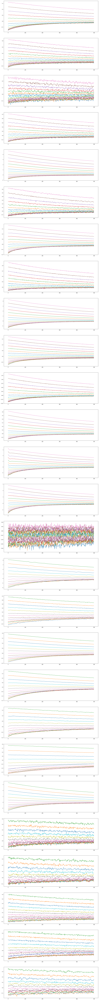

In [11]:
plt.figure(figsize=(20,8*len(ana)))
for i,a in enumerate(ana):
    I1_target, I2_target = get_targets(a)
    plt.subplot(len(ana),1, i+1)
    for I in I2_target:
        plt.plot(I[:500])

### Fitting just the conductances...

In [70]:
def g_residuals_fixed(p, a, states, targets, croptop = 0):
    I1, I2 = get_currents(a, states, (a.params['E_K'], p[0], p[1]), croptop = croptop)
    
    # compare to target
    I1 -= targets[0]
    I2 -= targets[1]
    
    return np.concatenate((I1.ravel(), I2.ravel()))

In [13]:
gfits = [0] * len(ana)
for i,a in enumerate(ana):
    hold_voltages = get_hold_voltages(a)
    targets = get_targets(a)
    states = get_states(a, hold_voltages, Kv21.p_kinetic)
    
    start = time.time()
    gfits[i] = scipy.optimize.least_squares(g_residuals_fixed, (0.085, 0.036),
                                           args = (a, states, targets),
                                           bounds = ([0, 0],
                                                     [0.5, 0.5]))
    print i, time.time() - start, gfits[i].cost

0 19.6017348766 5510.494425032917
1 25.4928019047 966.4582209712657
2 29.1696360111 348.2714324110759
3 23.1928181648 7677.939130556668
4 17.103096962 26208.903511442793
5 25.5544700623 2584.383427676965
6 18.2279019356 27795.843114431693
7 17.5462839603 16403.593915380938
8 17.9362900257 53205.256728501765
9 23.363656044 9184.08647209367
10 19.758243084 4212.617690370647
11 17.0193610191 23063.427347189405
12 14.0804200172 38609.20916498351
13 17.3629338741 21619.666245786793
14 34.6129260063 51.43236852465782
15 21.1125230789 308526.77367503545
16 22.3053691387 40563.29075808501
17 21.9118320942 83543.92848200668
18 16.1964080334 95005.24939413236
19 15.9466540813 265122.1560024832
20 19.1620738506 588796.4098834705
21 19.9162199497 155673.79339603143
22 26.4843459129 8860.959764286637
23 26.3810250759 15384.990144857846
24 23.1342818737 18160.967157544885
25 27.0162367821 8279.144062649422
26 26.6092309952 15988.938144261216


In [75]:
for i,c in enumerate(crop):
    if c == 0: continue
    hold_voltages = get_hold_voltages(a, croptop=c)
    targets = get_targets(a, croptop=c)
    states = get_states(a, hold_voltages, Kv21.p_kinetic, croptop=c)
    
    start = time.time()
    gfits[i] = scipy.optimize.least_squares(g_residuals_fixed, (0.085, 0.036),
                                           args = (a, states, targets, c),
                                           bounds = ([0, 0],
                                                     [0.5, 0.5]))
    print i, time.time() - start, gfits[i].cost

4 27.0939559937 15212.526071755965
8 23.1461389065 14112.08502596034
20 27.8800179958 15212.526071755965


In [14]:
for a, gf in zip(ana, gfits):
    print a.savebase[-17:], a.params['E_K'], gf.x

2017_12_06_0000-1 -64.6545386522572 [0.0894132  0.02699273]
2017_12_06_0004-5 -75.47761525629971 [0.01810023 0.01234888]
017_12_06_0009-10 -68.35480304281408 [0.01039088 0.00764261]
017_12_06_0013-14 -72.35743308619683 [0.03140003 0.02447414]
017_12_06_0017-18 -84.97989035780219 [0.12528991 0.04209192]
017_12_06_0021-22 -71.79750395981505 [0.02312429 0.01547929]
017_12_06_0025-26 -68.25849045068964 [0.07153465 0.03799211]
2018_05_03_0000-5 -76.95659699741415 [0.07593597 0.02710896]
2018_05_03_0007-9 -77.05116077103146 [0.13847028 0.04823104]
018_05_03_0015-17 -77.86872475251033 [0.05740835 0.0123998 ]
018_05_03_0019-21 -69.9776152815485 [0.04958376 0.02284558]
018_05_03_0023-25 -75.31873452940695 [0.12233948 0.04227517]
018_05_03_0067-69 -72.28347210817041 [0.10967185 0.0423281 ]
018_05_03_0071-73 -68.80990606414623 [0.13482822 0.03269316]
018_05_03_0075-77 -54.21432859856881 [0.00196053 0.00131812]
019_02_01_0072-74 -67.5649799607989 [0.25859396 0.03694753]
2019_02_08_0000-2 -70.76456

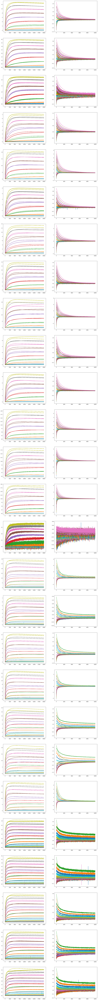

In [15]:
plt.figure(figsize=(20,8*len(ana)))

for i,a in enumerate(ana):
    states = get_states(a, get_hold_voltages(a), Kv21.p_kinetic)
    I1, I2 = get_currents(a, states, (a.params['E_K'], gfits[i].x[0], gfits[i].x[1]))
    I1_target, I2_target = get_targets(a)

    plt.subplot(len(ana),2, 2*i+1)
    for I in I1_target:
        plt.plot(I)
    plt.gca().set_prop_cycle(None)
    for I in I1:
        plt.plot(I)

    plt.subplot(len(ana),2, 2*i+2)
    for I in I2_target:
        plt.plot(I)
    plt.gca().set_prop_cycle(None)
    for I in I2:
        plt.plot(I)

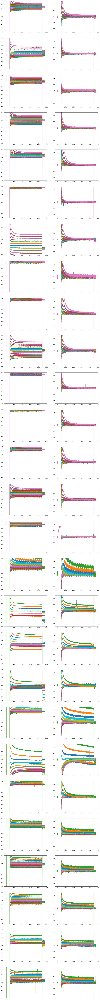

In [16]:
plt.figure(figsize=(20,8*len(ana)))
for i,a in enumerate(ana):
    gleak2 = ah.get_gleak(a.rec2, a.params['E_leak'], (0, Kv21.rec2_prepulse))
    I2_target = np.array([I - a.params['I_leak'](V, g)
                          for I, V, g in zip(a.rec2.current, a.rec2.voltage, gleak2)])
    plt.subplot(len(ana),2, 2*i+1)
    for I in a.rec2.current:
        plt.plot(I)
    plt.ylim((-2,0))
    
    plt.subplot(len(ana),2, 2*i+2)
    for I in I2_target:
        plt.plot(I)
    plt.ylim((-.5,.5))

The 2019 fits seem to be kinetically different (slower deactivation?), which worries me... but I can't go back on the kinetics here, not for the static fits. Actually, it could also be something to do with the electrodes or the solution -- it looks like maybe E_leak is moving around in addition to g_leak. >.<

In [76]:
for a, gf in zip(ana, gfits):
    a.params['gK_fast'] = gf.x[0]
    a.params['gK_slow'] = gf.x[1]
    #a.write()

## Kinetics fit

In [77]:
def residuals_kinetic(p, a, states, targets, hold_voltages, croptop = 0):
    states = get_states(a, hold_voltages, p[2:], croptop = croptop)
    I1, I2 = get_currents(a, states, (a.params['E_K'], p[0], p[1]), croptop = croptop)
    
    # compare to target
    I1 -= targets[0]
    I2 -= targets[1]
    
    return np.concatenate((I1.ravel(), I2.ravel()))

In [19]:
manager = mp.Manager()
mp_kfits = manager.list(range(len(ana)))
proc = [0]*len(ana)

def mp_func(i, args, fits):
    print "Fit %d starting at %s" % (i, time.strftime("%d %h %H:%M:%S"))
    fits[i] = scipy.optimize.least_squares(residuals_kinetic, np.concatenate(((.08, .03), Kv21.p_kinetic)),
                                           args = args,
                                           bounds = ([0, 0,
                                                      -30, 4,
                                                      0, 60, 20, 5, -50,
                                                      -10, -20,
                                                      0, 4e3, 10e3, -50, -40, 4,
                                                      -40, 4,
                                                      0, 250, 20, 5, -50
                                                     ],
                                                     [0.5, 0.5,
                                                      0, 40,
                                                      20, 160, 50, 50, -5,
                                                      20, -1,
                                                      500, 12e3, 100e3, -10, -4, 40,
                                                      0, 40,
                                                      100, 750, 50, 50, -5
                                                     ]))
    print "Fit %d complete at %s" % (i, time.strftime("%d %h %H:%M:%S"))

In [20]:
for i,a in enumerate(ana[:14]):
    hold_voltages = get_hold_voltages(a)
    targets = get_targets(a)
    proc[i] = mp.Process(target = mp_func, args = (i, (a, states, targets, hold_voltages), mp_kfits))
    proc[i].start()

Fit 0 starting at 02 Aug 10:20:15
Fit 1 starting at 02 Aug 10:20:15
Fit 2 starting at 02 Aug 10:20:15
Fit 3 starting at 02 Aug 10:20:15
Fit 4 starting at 02 Aug 10:20:16
Fit 5 starting at 02 Aug 10:20:16
Fit 6 starting at 02 Aug 10:20:16
Fit 7 starting at 02 Aug 10:20:16
Fit 8 starting at 02 Aug 10:20:16
Fit 9 starting at 02 Aug 10:20:16
Fit 10 starting at 02 Aug 10:20:16
Fit 11 starting at 02 Aug 10:20:17
Fit 12 starting at 02 Aug 10:20:17
Fit 13 starting at 02 Aug 10:20:17
Fit 8 complete at 02 Aug 14:00:47
Fit 10 complete at 02 Aug 14:25:55
Fit 9 complete at 02 Aug 15:37:08
Fit 3 complete at 02 Aug 15:40:21
Fit 1 complete at 02 Aug 16:38:39
Fit 2 complete at 02 Aug 18:45:25
Fit 7 complete at 02 Aug 18:47:09
Fit 13 complete at 02 Aug 19:44:49
Fit 6 complete at 02 Aug 20:19:28
Fit 4 complete at 02 Aug 20:59:22
Fit 0 complete at 02 Aug 21:42:39
Fit 12 complete at 02 Aug 22:20:25
Fit 11 complete at 03 Aug 19:17:46
Fit 5 complete at 07 Aug 20:16:12


In [21]:
for i,a in enumerate(ana[14:]):
    i = 14+i
    hold_voltages = get_hold_voltages(a)
    targets = get_targets(a)
    proc[i] = mp.Process(target = mp_func, args = (i, (a, states, targets, hold_voltages), mp_kfits))
    proc[i].start()

Fit 14 starting at 02 Aug 10:20:17
Fit 15 starting at 02 Aug 10:20:17
Fit 16 starting at 02 Aug 10:20:18
Fit 17 starting at 02 Aug 10:20:18
Fit 18 starting at 02 Aug 10:20:18
Fit 19 starting at 02 Aug 10:20:19
Fit 20 starting at 02 Aug 10:20:19
Fit 21 starting at 02 Aug 10:20:19
Fit 22 starting at 02 Aug 10:20:20
Fit 23 starting at 02 Aug 10:20:20
Fit 24 starting at 02 Aug 10:20:20
Fit 25 starting at 02 Aug 10:20:20
Fit 26 starting at 02 Aug 10:20:21
Fit 24 complete at 02 Aug 12:46:55
Fit 16 complete at 02 Aug 14:50:54
Fit 14 complete at 02 Aug 14:51:57
Fit 26 complete at 02 Aug 15:49:54
Fit 22 complete at 02 Aug 16:11:04
Fit 25 complete at 02 Aug 16:43:29
Fit 19 complete at 02 Aug 16:46:18
Fit 23 complete at 02 Aug 17:54:20
Fit 17 complete at 02 Aug 19:07:55
Fit 20 complete at 02 Aug 19:13:22
Fit 18 complete at 02 Aug 21:36:44
Fit 21 complete at 02 Aug 21:39:10
Fit 15 complete at 04 Aug 07:08:34


In [78]:
for i,croptop in enumerate(crop):
    if croptop == 0: continue
    hold_voltages = get_hold_voltages(a, croptop)
    targets = get_targets(a, croptop)
    proc[i] = mp.Process(target = mp_func, args = (i, (a, states, targets, hold_voltages, croptop), mp_kfits))
    proc[i].start()

Fit 4 starting at 09 Aug 15:29:34
Fit 8 starting at 09 Aug 15:29:34
Fit 20 starting at 09 Aug 15:29:34
Fit 20 complete at 09 Aug 16:27:52
Fit 4 complete at 09 Aug 16:29:03
Fit 8 complete at 09 Aug 17:06:49


In [79]:
kcost = [0]*len(proc)
for i,p in enumerate(proc):
    if p.is_alive():
        print i
    else:
        p.join(5)
        ana[i].kparams = mp_kfits[i].x
        kcost[i] = mp_kfits[i].cost
#         print '%s:\n%s\n' % (ana[i].paramsfile, ana[i].params_str())
        #ana[i].write()
print np.mean(kcost), np.std(kcost)

810.9436412438687 1177.8940239561875


0 435.87370401743624
1 100.36774559084671
2 72.15655058209038
3 110.14432682975323
4 453.39561781719874
5 52.29307474657534
6 559.357151207437
7 478.951274914687
8 356.335766704746
9 360.57858475309115
10 161.80102702801355
11 1168.8787828709671
12 1212.480674672193
13 1558.3612541987923
14 133.78903889365773
15 2140.0651372648376
16 855.6171931766349
17 423.32509316535396
18 436.0615292622484
19 6054.520233124731
20 453.39561781719874
21 718.023256335545
22 264.9983132306679
23 314.7593566772939
24 2272.729327950752
25 305.10586403027446
26 442.1128167214323


(array([19.,  4.,  1.,  2.,  0.,  0.,  0.,  0.,  0.,  1.]),
 array([  52.29307475,  652.51579058, 1252.73850642, 1852.96122226,
        2453.1839381 , 3053.40665394, 3653.62936977, 4253.85208561,
        4854.07480145, 5454.29751729, 6054.52023312]),
 <a list of 10 Patch objects>)

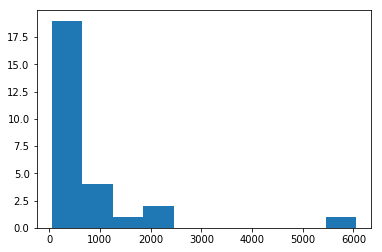

In [80]:
for i,c in enumerate(kcost):
    print i,c
plt.hist(kcost)

In [81]:
for a in ana:
    a.write()

### Checking the results...

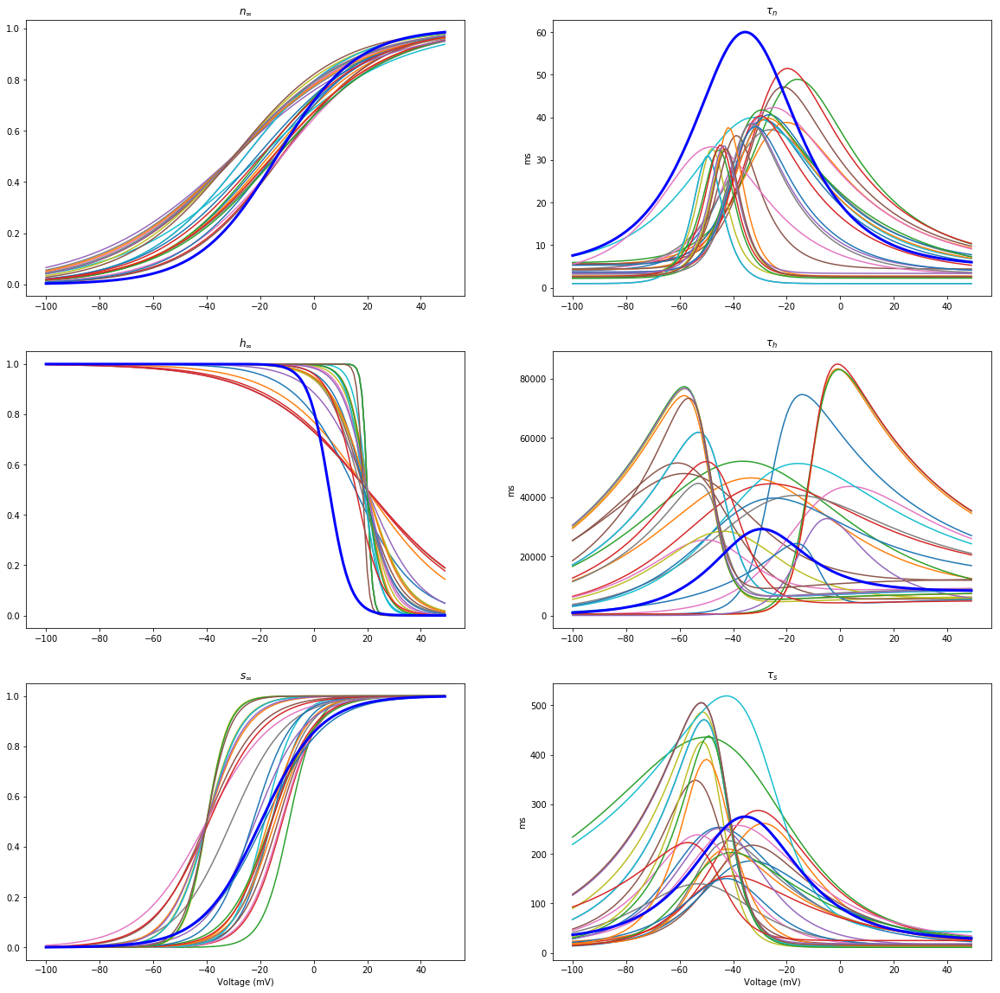

In [83]:
plt.figure(figsize=(20,20))
Vprobe = np.arange(-100,50)
for i,a in enumerate(ana):
    if i == 14: continue
    if not hasattr(a, 'kparams'): continue
    plt.subplot(3,2,1)
    plt.plot(Vprobe, Kv21.sigmoid(Kv21.x_n(a.kparams[2:]), Vprobe))
    plt.subplot(3,2,2)
    plt.plot(Vprobe, Kv21.taun(Kv21.x_taun(a.kparams[2:]), Vprobe))
    plt.subplot(3,2,3)
    plt.plot(Vprobe, Kv21.sigmoid(Kv21.x_h(a.kparams[2:]), Vprobe))
    plt.subplot(3,2,4)
    plt.plot(Vprobe, Kv21.tauh(Kv21.x_tauh(a.kparams[2:]), Vprobe))
    plt.subplot(3,2,5)
    plt.plot(Vprobe, Kv21.sigmoid(Kv21.x_s(a.kparams[2:]), Vprobe))
    plt.subplot(3,2,6)
    plt.plot(Vprobe, Kv21.taun(Kv21.x_taus(a.kparams[2:]), Vprobe))

plt.subplot(3,2,1).set_title(r"$n_\infty$")
plt.plot(Vprobe, Kv21.sigmoid(Kv21.x_n(Kv21.p_kinetic), Vprobe), 'b', lw=3)
plt.subplot(3,2,2).set_title(r"$\tau_n$")
plt.ylabel('ms')
plt.plot(Vprobe, Kv21.taun(Kv21.x_taun(Kv21.p_kinetic), Vprobe), 'b', lw=3)
plt.subplot(3,2,3).set_title(r"$h_\infty$")
plt.plot(Vprobe, Kv21.sigmoid(Kv21.x_h(Kv21.p_kinetic), Vprobe), 'b', lw=3)
plt.subplot(3,2,4).set_title(r"$\tau_h$")
plt.ylabel('ms')
plt.plot(Vprobe, Kv21.tauh(Kv21.x_tauh(Kv21.p_kinetic), Vprobe), 'b', lw=3)
plt.subplot(3,2,5).set_title(r"$s_\infty$")
plt.xlabel('Voltage (mV)')
plt.plot(Vprobe, Kv21.sigmoid(Kv21.x_s(Kv21.p_kinetic), Vprobe), 'b', lw=3)
plt.subplot(3,2,6).set_title(r"$\tau_s$")
plt.ylabel('ms')
plt.xlabel('Voltage (mV)')
plt.plot(Vprobe, Kv21.taun(Kv21.x_taus(Kv21.p_kinetic), Vprobe), 'b', lw=3);

plt.savefig('/home/kernfel/Documents/Thesis/Models figures/Kv21x-full-record-fit-variables.svg')

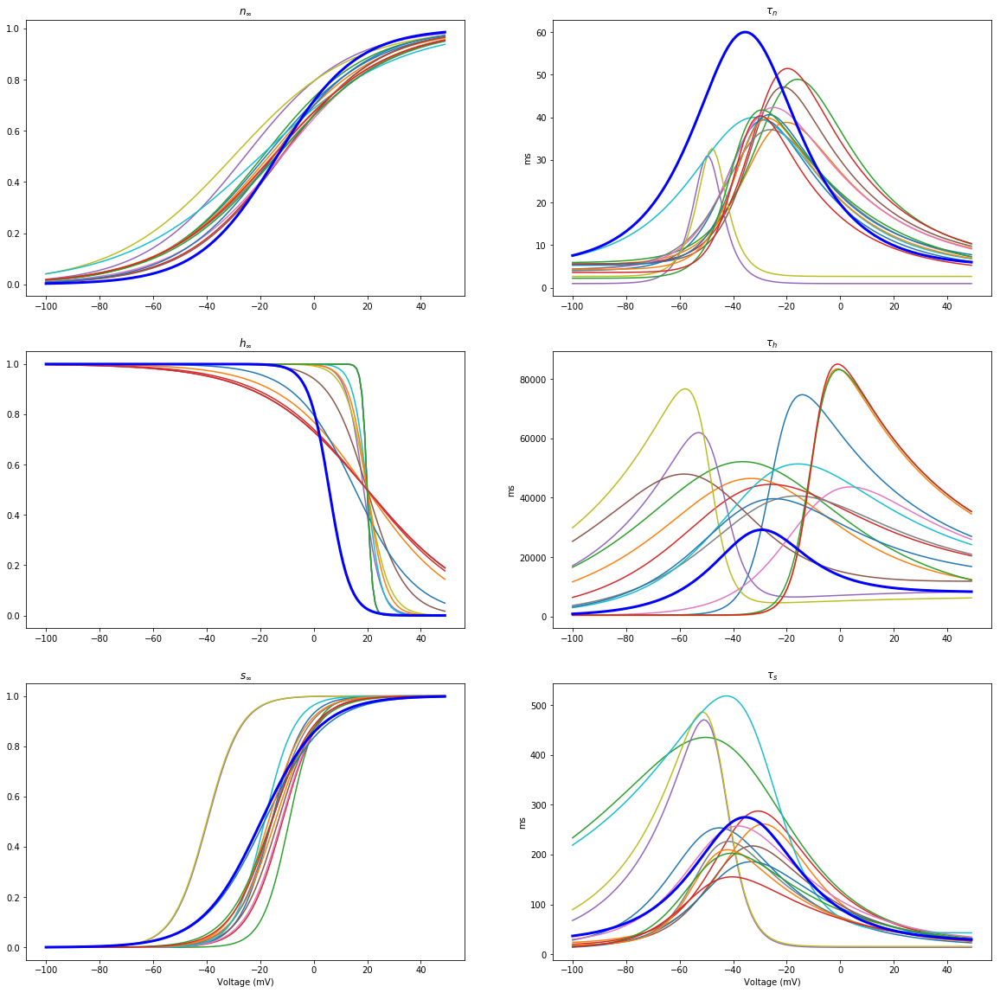

In [84]:
plt.figure(figsize=(20,20))
Vprobe = np.arange(-100,50)
for a in ana[:14]:
    if not hasattr(a, 'kparams'): continue
    plt.subplot(3,2,1)
    plt.plot(Vprobe, Kv21.sigmoid(Kv21.x_n(a.kparams[2:]), Vprobe))
    plt.subplot(3,2,2)
    plt.plot(Vprobe, Kv21.taun(Kv21.x_taun(a.kparams[2:]), Vprobe))
    plt.subplot(3,2,3)
    plt.plot(Vprobe, Kv21.sigmoid(Kv21.x_h(a.kparams[2:]), Vprobe))
    plt.subplot(3,2,4)
    plt.plot(Vprobe, Kv21.tauh(Kv21.x_tauh(a.kparams[2:]), Vprobe))
    plt.subplot(3,2,5)
    plt.plot(Vprobe, Kv21.sigmoid(Kv21.x_s(a.kparams[2:]), Vprobe))
    plt.subplot(3,2,6)
    plt.plot(Vprobe, Kv21.taun(Kv21.x_taus(a.kparams[2:]), Vprobe))

plt.subplot(3,2,1).set_title(r"$n_\infty$")
plt.plot(Vprobe, Kv21.sigmoid(Kv21.x_n(Kv21.p_kinetic), Vprobe), 'b', lw=3)
plt.subplot(3,2,2).set_title(r"$\tau_n$")
plt.ylabel('ms')
plt.plot(Vprobe, Kv21.taun(Kv21.x_taun(Kv21.p_kinetic), Vprobe), 'b', lw=3)
plt.subplot(3,2,3).set_title(r"$h_\infty$")
plt.plot(Vprobe, Kv21.sigmoid(Kv21.x_h(Kv21.p_kinetic), Vprobe), 'b', lw=3)
plt.subplot(3,2,4).set_title(r"$\tau_h$")
plt.ylabel('ms')
plt.plot(Vprobe, Kv21.tauh(Kv21.x_tauh(Kv21.p_kinetic), Vprobe), 'b', lw=3)
plt.subplot(3,2,5).set_title(r"$s_\infty$")
plt.xlabel('Voltage (mV)')
plt.plot(Vprobe, Kv21.sigmoid(Kv21.x_s(Kv21.p_kinetic), Vprobe), 'b', lw=3)
plt.subplot(3,2,6).set_title(r"$\tau_s$")
plt.ylabel('ms')
plt.xlabel('Voltage (mV)')
plt.plot(Vprobe, Kv21.taun(Kv21.x_taus(Kv21.p_kinetic), Vprobe), 'b', lw=3);

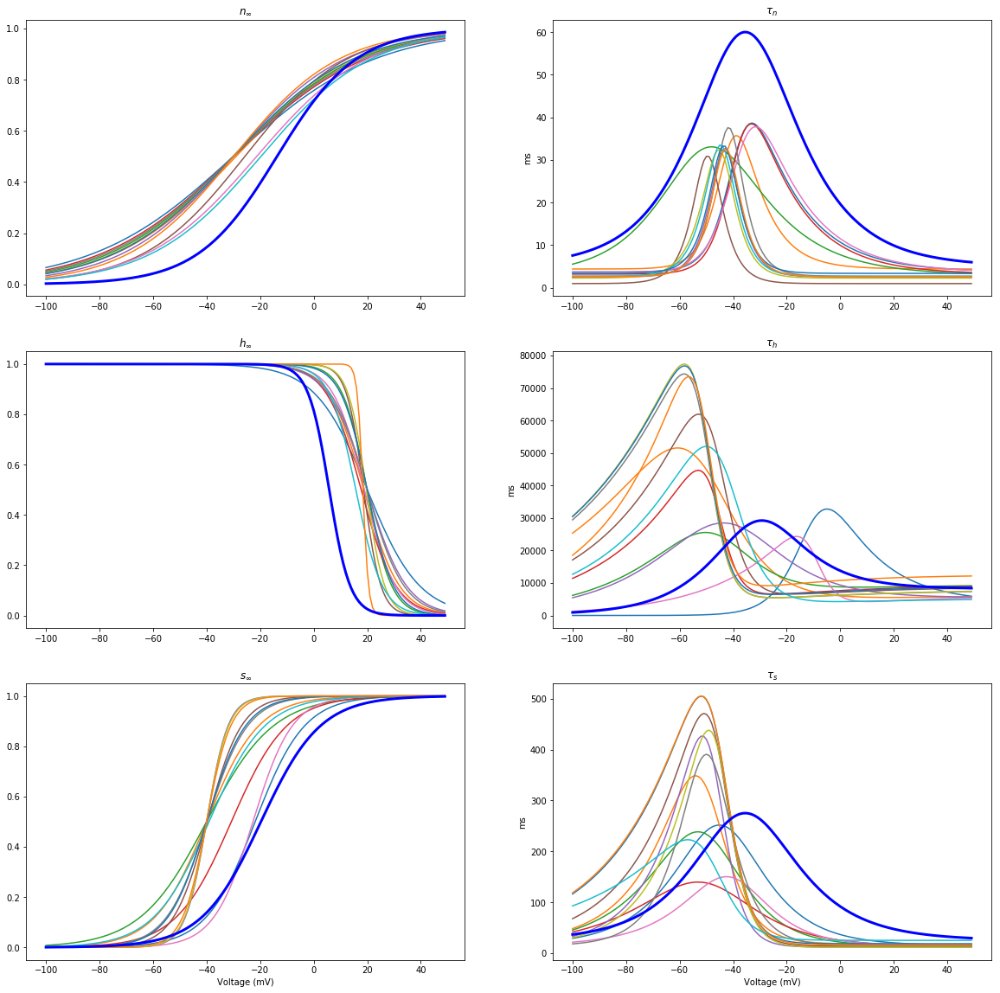

In [85]:
plt.figure(figsize=(20,20))
Vprobe = np.arange(-100,50)
for a in ana[15:]:
    if not hasattr(a, 'kparams'): continue
    plt.subplot(3,2,1)
    plt.plot(Vprobe, Kv21.sigmoid(Kv21.x_n(a.kparams[2:]), Vprobe))
    plt.subplot(3,2,2)
    plt.plot(Vprobe, Kv21.taun(Kv21.x_taun(a.kparams[2:]), Vprobe))
    plt.subplot(3,2,3)
    plt.plot(Vprobe, Kv21.sigmoid(Kv21.x_h(a.kparams[2:]), Vprobe))
    plt.subplot(3,2,4)
    plt.plot(Vprobe, Kv21.tauh(Kv21.x_tauh(a.kparams[2:]), Vprobe))
    plt.subplot(3,2,5)
    plt.plot(Vprobe, Kv21.sigmoid(Kv21.x_s(a.kparams[2:]), Vprobe))
    plt.subplot(3,2,6)
    plt.plot(Vprobe, Kv21.taun(Kv21.x_taus(a.kparams[2:]), Vprobe))

plt.subplot(3,2,1).set_title(r"$n_\infty$")
plt.plot(Vprobe, Kv21.sigmoid(Kv21.x_n(Kv21.p_kinetic), Vprobe), 'b', lw=3)
plt.subplot(3,2,2).set_title(r"$\tau_n$")
plt.ylabel('ms')
plt.plot(Vprobe, Kv21.taun(Kv21.x_taun(Kv21.p_kinetic), Vprobe), 'b', lw=3)
plt.subplot(3,2,3).set_title(r"$h_\infty$")
plt.plot(Vprobe, Kv21.sigmoid(Kv21.x_h(Kv21.p_kinetic), Vprobe), 'b', lw=3)
plt.subplot(3,2,4).set_title(r"$\tau_h$")
plt.ylabel('ms')
plt.plot(Vprobe, Kv21.tauh(Kv21.x_tauh(Kv21.p_kinetic), Vprobe), 'b', lw=3)
plt.subplot(3,2,5).set_title(r"$s_\infty$")
plt.xlabel('Voltage (mV)')
plt.plot(Vprobe, Kv21.sigmoid(Kv21.x_s(Kv21.p_kinetic), Vprobe), 'b', lw=3)
plt.subplot(3,2,6).set_title(r"$\tau_s$")
plt.ylabel('ms')
plt.xlabel('Voltage (mV)')
plt.plot(Vprobe, Kv21.taun(Kv21.x_taus(Kv21.p_kinetic), Vprobe), 'b', lw=3);

-72.28347210817041
-68.08969374340668


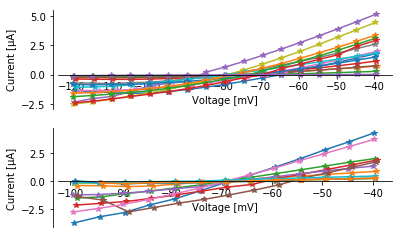

In [86]:
plt.figure()
ax = plt.subplot(2,1,1)
for a in ana[:15]:
        
    tail_t0 = [ah.exp2_decay(0, a.rec2.pdecay[i]) for i in range(len(a.rec2.tails))]

    included = ah.linear_exclude_outliers(a.rec2.tail_voltages, tail_t0)
    tail_I = np.array(tail_t0)[included]
    tail_V = np.array(a.rec2.tail_voltages)[included]
    
    ah.IVplot(tail_I, tail_V, ax)

ax = plt.subplot(2,1,2)    
for a in ana[15:]:
        
    tail_t0 = [ah.exp2_decay(0, a.rec2.pdecay[i]) for i in range(len(a.rec2.tails))]

    included = ah.linear_exclude_outliers(a.rec2.tail_voltages, tail_t0)
    tail_I = np.array(tail_t0)[included]
    tail_V = np.array(a.rec2.tail_voltages)[included]
    
    ah.IVplot(tail_I, tail_V, ax)
    
print(np.median([a.params['E_K'] for a in ana[:15]]))
print(np.median([a.params['E_K'] for a in ana[15:]]))